In [2]:

import os
import cv2
import numpy as np
import tensorflow as tf
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix 
from sklearn.utils.multiclass import unique_labels 
import pandas as pd
import torch

In [6]:
flowers = "flowers"
images = []
labels = []

In [7]:
for subfolder in os.listdir(flowers):
    subfolder_path = os.path.join(flowers, subfolder)
    if os.path.isdir(subfolder_path):
        label = subfolder
        for image_file in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_file)
            print(image_path)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (150, 150))
            image = image.astype('float')/255.0
            images.append(image)
            labels.append(label)

flowers\daisy\100080576_f52e8ee070_n.jpg
flowers\daisy\10140303196_b88d3d6cec.jpg
flowers\daisy\10172379554_b296050f82_n.jpg
flowers\daisy\10172567486_2748826a8b.jpg
flowers\daisy\10172636503_21bededa75_n.jpg
flowers\daisy\102841525_bd6628ae3c.jpg
flowers\daisy\10300722094_28fa978807_n.jpg
flowers\daisy\1031799732_e7f4008c03.jpg
flowers\daisy\10391248763_1d16681106_n.jpg
flowers\daisy\10437754174_22ec990b77_m.jpg
flowers\daisy\10437770546_8bb6f7bdd3_m.jpg
flowers\daisy\10437929963_bc13eebe0c.jpg
flowers\daisy\10466290366_cc72e33532.jpg
flowers\daisy\10466558316_a7198b87e2.jpg
flowers\daisy\10555749515_13a12a026e.jpg
flowers\daisy\10555815624_dc211569b0.jpg
flowers\daisy\10555826524_423eb8bf71_n.jpg
flowers\daisy\10559679065_50d2b16f6d.jpg
flowers\daisy\105806915_a9c13e2106_n.jpg
flowers\daisy\10712722853_5632165b04.jpg
flowers\daisy\107592979_aaa9cdfe78_m.jpg
flowers\daisy\10770585085_4742b9dac3_n.jpg
flowers\daisy\10841136265_af473efc60.jpg
flowers\daisy\10993710036_2033222c91.jpg
flo

In [8]:
images = np.array(images)
labels = np.array(labels)


In [9]:
len(images),len(labels)

(4317, 4317)

In [10]:
print(np.unique(labels))

['daisy' 'dandelion' 'rose' 'sunflower' 'tulip']


In [11]:
labels[1000:1005]

array(['dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion'], dtype='<U9')

In [12]:
def show_25_images(go):
    plt.figure(figsize=(10, 10))
    for i in range(go, go+25):
        plt.subplot(5, 5, i-go+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid = False
        plt.imshow(images[i], cmap=plt.cm.binary)
        plt.xlabel(labels[i])
    plt.show()
    

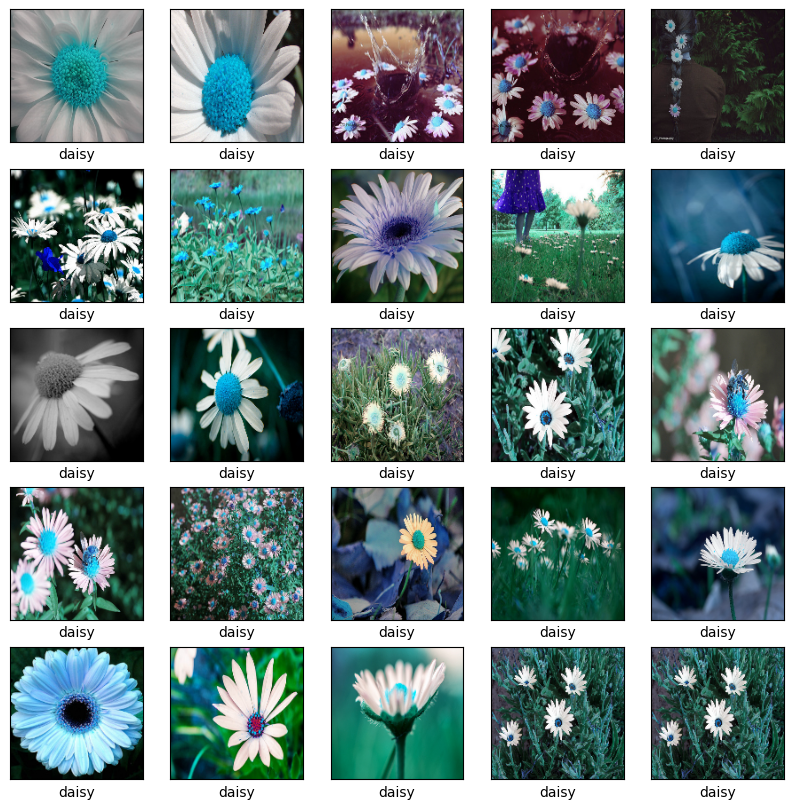

In [13]:
show_25_images(0)

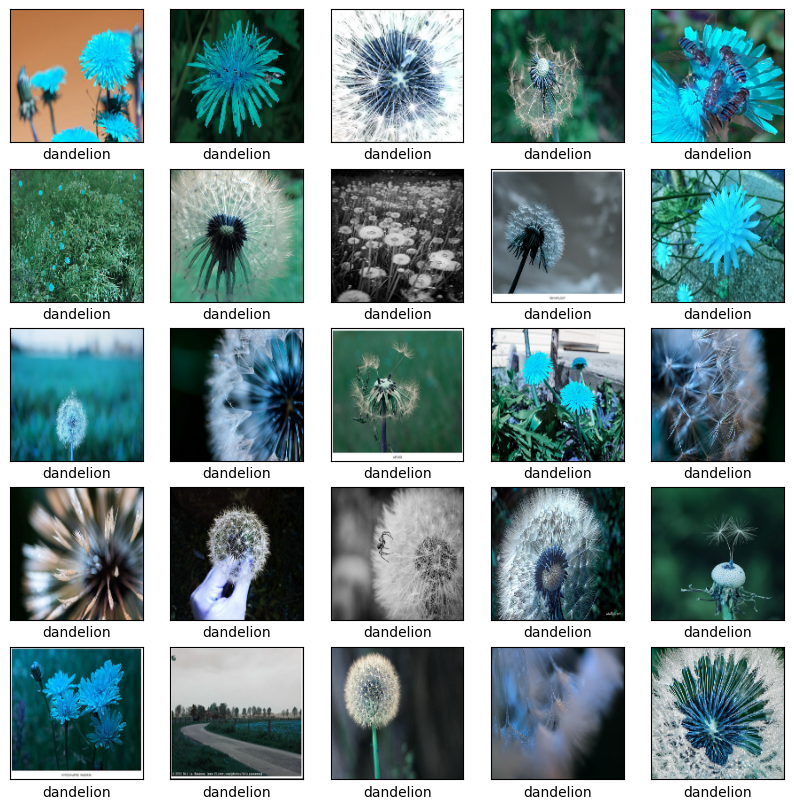

In [14]:
show_25_images(1000)

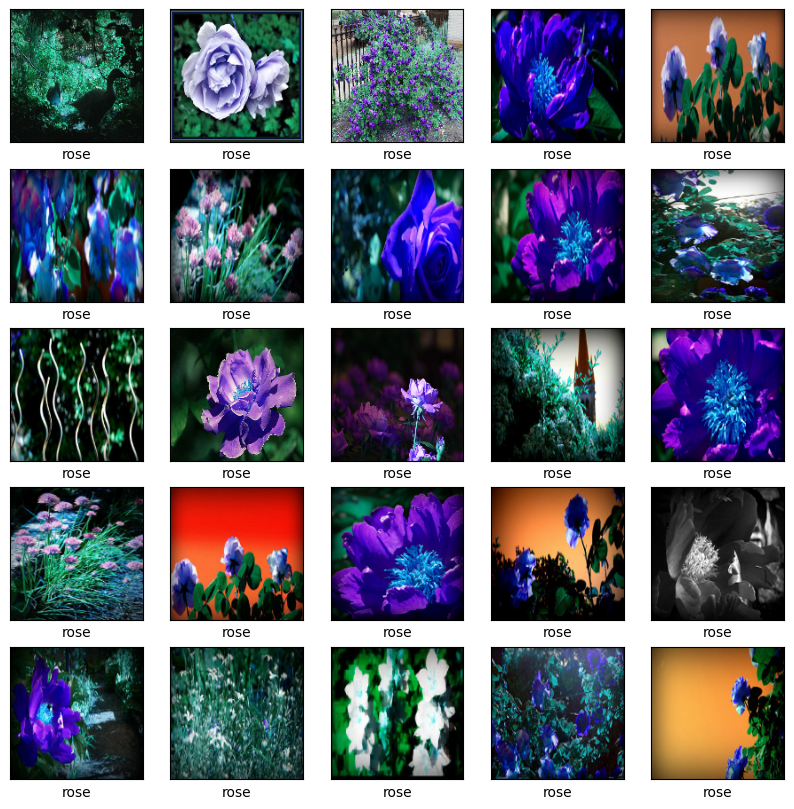

In [15]:
show_25_images(2001)

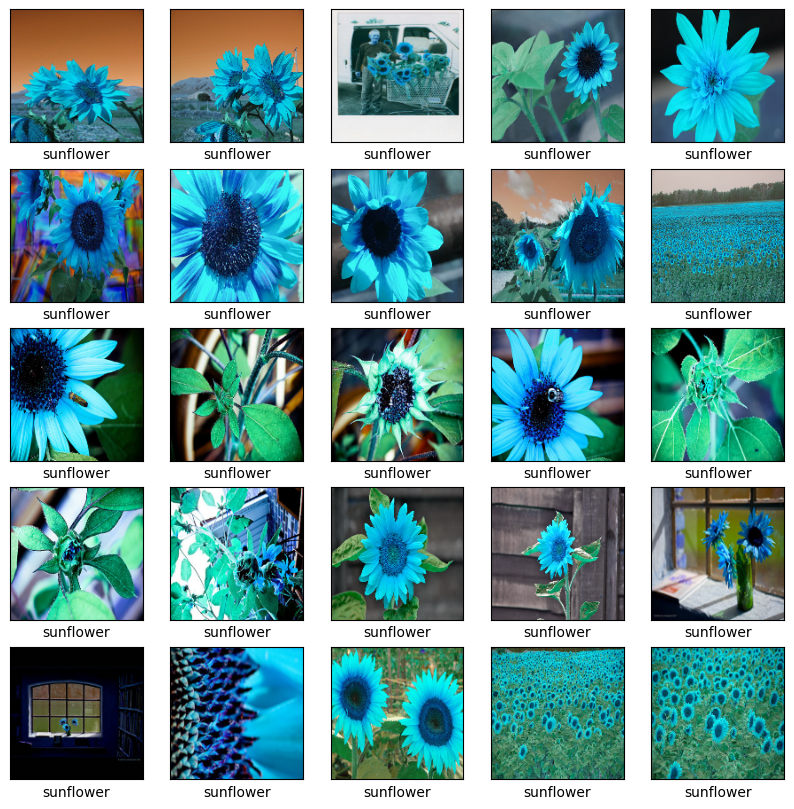

In [16]:
show_25_images(3001)

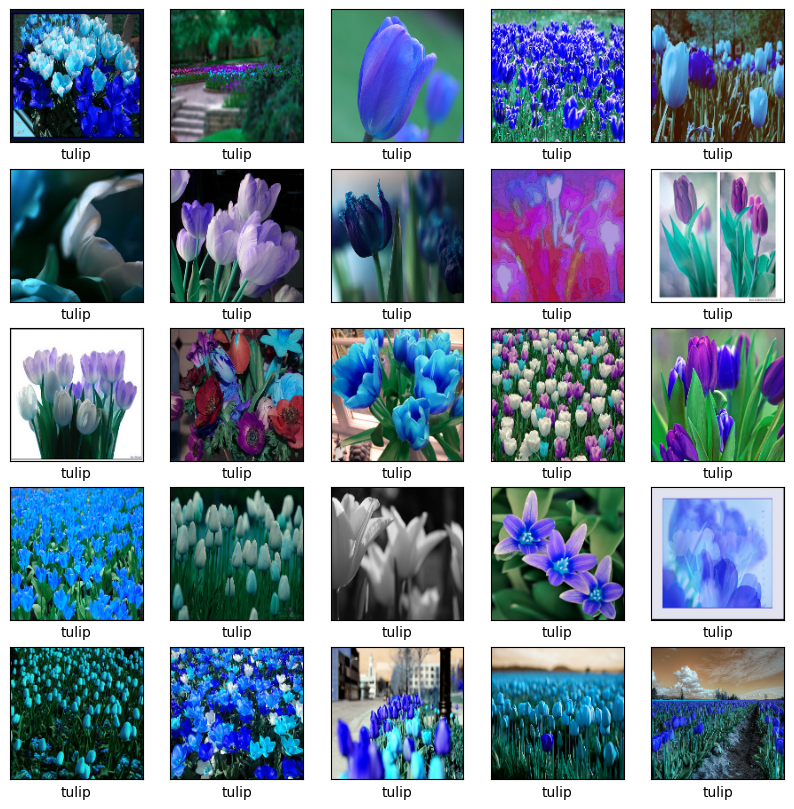

In [17]:
show_25_images(4001)

In [18]:
label_to_index = {label: i for i, label in enumerate(np.unique(labels))}

In [19]:
label_to_index

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [20]:
labels = np.array([label_to_index[label] for label in labels])

In [21]:
labels[:4000:100]

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4])

In [22]:
num_classes = len(np.unique(labels))

In [23]:
num_classes

5

In [24]:
labels = to_categorical(labels,num_classes=num_classes)

In [25]:
labels[0:4300:1000]

array([[          1,           0,           0,           0,           0],
       [          0,           1,           0,           0,           0],
       [          0,           0,           1,           0,           0],
       [          0,           0,           0,           1,           0],
       [          0,           0,           0,           0,           1]], dtype=float32)

In [26]:
print(images.shape)
print(labels.shape)

(4317, 150, 150, 3)
(4317, 5)


In [27]:
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, random_state=42)

In [28]:
print("Train Images shape:", train_images.shape)
print("Train Labels shape:", train_labels.shape)
print("Test Images shape:", test_images.shape)
print("Test Labels shape:", test_labels.shape)

Train Images shape: (3453, 150, 150, 3)
Train Labels shape: (3453, 5)
Test Images shape: (864, 150, 150, 3)
Test Labels shape: (864, 5)


In [29]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [33]:
def build_model(hp):
    model = tf.keras.models.Sequential([
        tf.keras.layers.Input(shape=(150, 150, 3)),
        tf.keras.layers.Conv2D(
            filters=hp.Int('conv_1_filter', min_value = 32, max_value = 128, step = 16),
            kernel_size = hp.Choice('conv_1_kernal', values = [3,5]),
            activation = 'relu'),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Conv2D(
            filters=hp.Int('conv_2_filter', min_value = 32, max_value = 128, step = 16),
            kernel_size = hp.Choice('conv_2_kernal', values = [3,5]),
            activation = 'relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(
            filters=hp.Int('conv_1_filter', min_value = 32, max_value = 128, step = 16),
            kernel_size = hp.Choice('conv_1_kernal', values = [3,5]),
            activation = 'relu'),
        tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(256, activation="relu"),
        tf.keras.layers.Dense(5, activation="softmax")
         ])
    model.compile(optimizer=tf.keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3])),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    return model

In [35]:
from keras_tuner import RandomSearch
from keras_tuner.engine.hyperparameters import HyperParameters

In [36]:
tuner_search=RandomSearch(build_model,
                          objective='val_accuracy',
                          max_trials=5,directory='output',project_name="flowers")

INFO:tensorflow:Reloading Tuner from output\flowers\tuner0.json


In [37]:
tuner_search.search(train_images,train_labels,epochs=3,validation_split=0.1)

INFO:tensorflow:Oracle triggered exit


In [38]:
model=tuner_search.get_best_models(num_models=1)[0]

In [39]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 146, 146, 64)      4864      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 73, 73, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 69, 69, 48)        76848     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 34, 34, 48)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 30, 30, 64)        76864     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 15, 15, 64)       0

In [40]:
batch_size = 32
epochs = 20

history = model.fit(
    datagen.flow(train_images, train_labels, batch_size=batch_size),
    steps_per_epoch=len(train_images) // batch_size,
    epochs=epochs,
    validation_data=(test_images, test_labels))

Epoch 1/20
107/107 [==============================] - 60s 555ms/step - loss: 0.9950 - accuracy: 0.6103 - val_loss: 0.9653 - val_accuracy: 0.6238
Epoch 2/20
107/107 [==============================] - 59s 548ms/step - loss: 0.9286 - accuracy: 0.6375 - val_loss: 0.9189 - val_accuracy: 0.6551
Epoch 3/20
107/107 [==============================] - 59s 554ms/step - loss: 0.9027 - accuracy: 0.6483 - val_loss: 0.9126 - val_accuracy: 0.6505
Epoch 4/20
107/107 [==============================] - 59s 548ms/step - loss: 0.8812 - accuracy: 0.6612 - val_loss: 1.0742 - val_accuracy: 0.5822
Epoch 5/20
107/107 [==============================] - 59s 551ms/step - loss: 0.8239 - accuracy: 0.6823 - val_loss: 0.8579 - val_accuracy: 0.6852
Epoch 6/20
107/107 [==============================] - 67s 630ms/step - loss: 0.8175 - accuracy: 0.6858 - val_loss: 0.8395 - val_accuracy: 0.6748
Epoch 7/20
107/107 [==============================] - 70s 649ms/step - loss: 0.8058 - accuracy: 0.6910 - val_loss: 0.7674 - val_ac

27/27 [==============================] - 3s 115ms/step - loss: 0.7181 - accuracy: 0.7477
test_loss:, [0.7181259989738464, 0.7476851940155029]


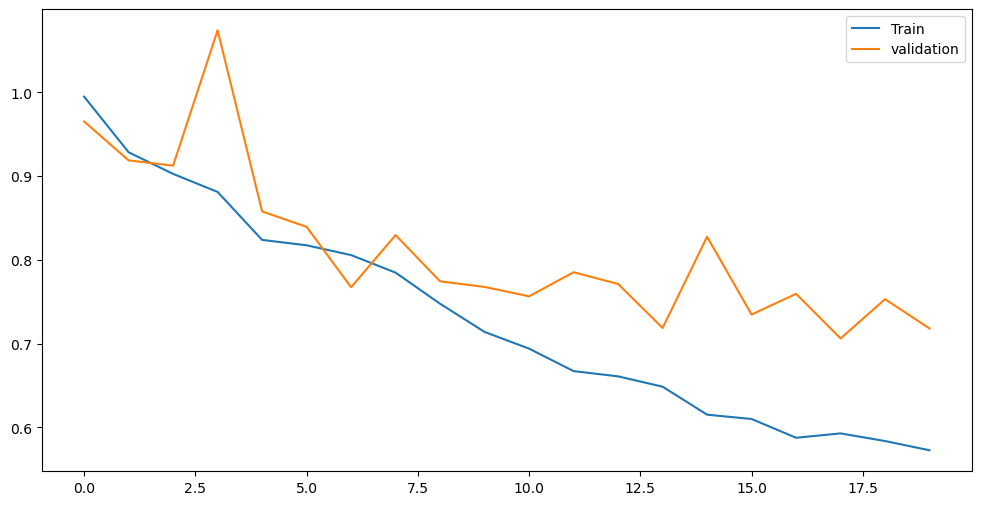

In [41]:
plt.figure(figsize=(12, 6))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["Train", "validation"], loc="upper right")

loss=model.evaluate(test_images, test_labels)
print(f"test_loss:, {loss}")

In [42]:
test_loss, test_acc= model.evaluate(test_images, test_labels, verbose=2)
print("\nTest loss=", test_loss)
print("\nTest accuracy=", test_acc)


27/27 - 3s - loss: 0.7181 - accuracy: 0.7477 - 3s/epoch - 114ms/step

Test loss= 0.7181259989738464

Test accuracy= 0.7476851940155029


In [ ]:
model.save("E:/sample_project/flowers/flowers final/models/flowers-label-classification-model-Adam.keras")

In [ ]:
predictions=detection_model.predict(test_images)

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(30):
    plt.subplot(6, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid = False
    plt.imshow(test_images[i], cmap=plt.cm.binary)
    plt.xlabel(test_labels[i])
plt.show()

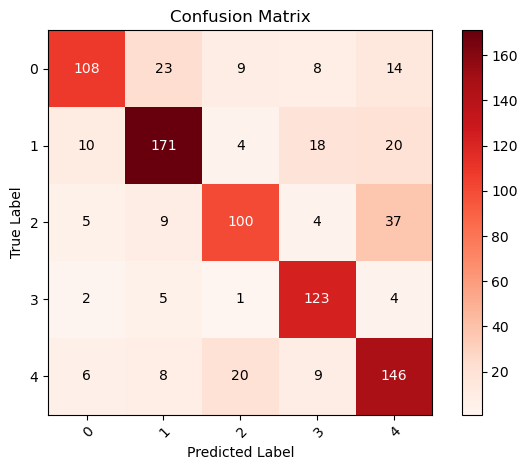

In [29]:

test_labels_indices = np.argmax(test_labels, axis=1)
predictions_indices = np.argmax(predictions, axis=1)


cm = confusion_matrix(test_labels_indices, predictions_indices)


classes = unique_labels(test_labels_indices, predictions_indices)


fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Reds)
ax.figure.colorbar(im, ax=ax)


ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=classes, yticklabels=classes,
       title='Confusion Matrix',
       ylabel='True Label',
       xlabel='Predicted Label')


plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")



for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.tight_layout()
plt.show()

In [31]:
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(test_labels, axis=1)


same_labels_indices = []
different_labels_indices = []


for i in range(len(predicted_labels)):
    if predicted_labels[i] == true_labels[i]:
        same_labels_indices.append(i)
    else:
        different_labels_indices.append(i)

27/27 [==============================] - 3s 123ms/step


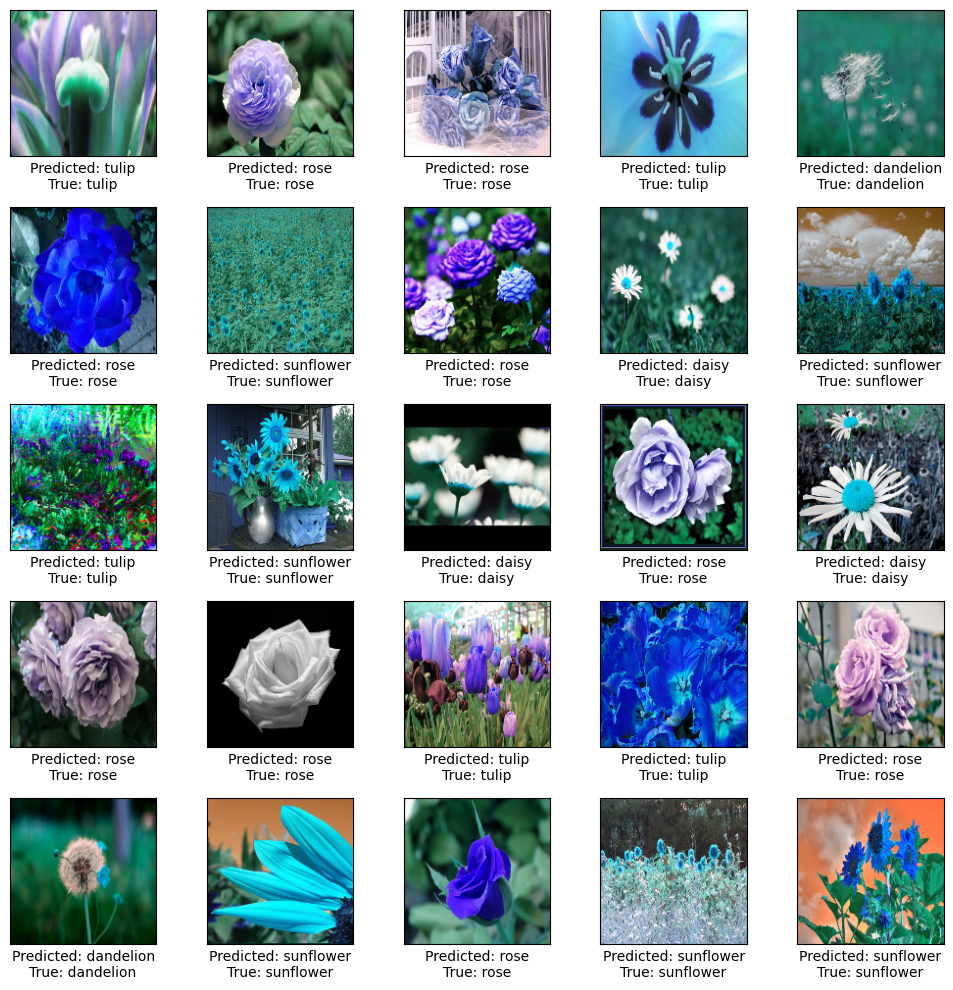

In [32]:
index_to_label = {i: label for label, i in label_to_index.items()}

plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid = True
    plt.imshow(test_images[same_labels_indices[i]], cmap=plt.cm.binary)
    predicted_label = index_to_label[predicted_labels[same_labels_indices[i]]]
    true_label = index_to_label[true_labels[same_labels_indices[i]]]
    plt.xlabel("Predicted: {}\nTrue: {}".format(predicted_label, true_label), wrap=True)
plt.tight_layout()
plt.show()

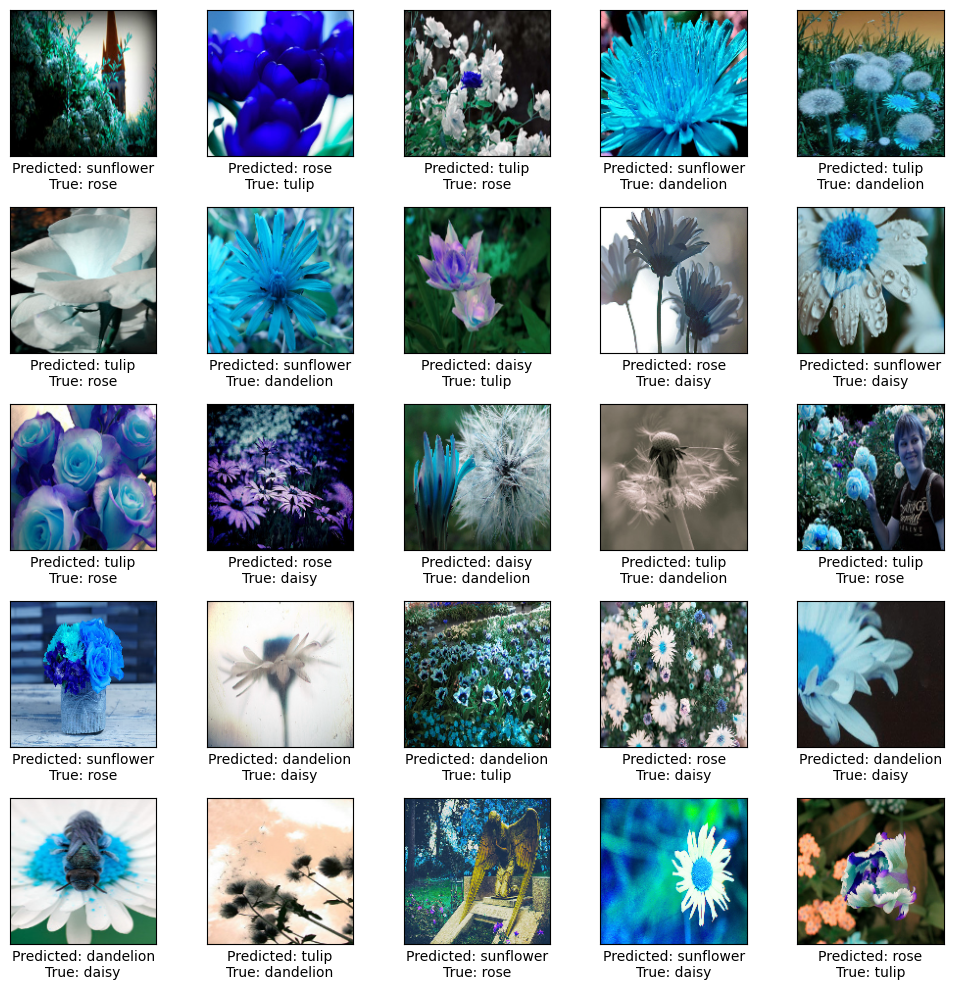

In [33]:

plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid = False
    plt.imshow(test_images[different_labels_indices[i]], cmap=plt.cm.binary)
    predicted_label = index_to_label[predicted_labels[different_labels_indices[i]]]
    true_label = index_to_label[true_labels[different_labels_indices[i]]]
    plt.xlabel("Predicted: {}\nTrue: {}".format(predicted_label, true_label), wrap=True)
plt.tight_layout()
plt.show()

In [1]:
from ultralytics import YOLO

In [4]:
classifying_label_model = tf.keras.models.load_model("E:/sample_project/flowers/flowers final/models/flowers-label-classification-model-Adam.keras")
detection_model = YOLO('E:/sample_project/flowers/flowers final/Flower detection/runs/detect/train9/weights/best.pt')

In [5]:
def process_image(image_path):
    results = detection_model([image_path]) 

    # Get the first result from the list (assuming only one image was processed)
    result = results[0]

    # Get the bounding boxes and their area
    boxes = result.boxes
    areas = (boxes.xyxy[:, 2] - boxes.xyxy[:, 0]) * (boxes.xyxy[:, 3] - boxes.xyxy[:, 1])

    # Check if there are any bounding boxes detected
    if len(areas) == 0:
        print("No bounding boxes detected in the image.")
        return 0  # or handle this case as per your requirement

    # Convert the areas to a NumPy array if desired
    areas_np = areas.cpu().numpy()  # If using GPU, convert to CPU and then to NumPy

    # Calculate the larger area
    larger_area = np.max(areas_np)

    # Now, you can access the larger area in the 'larger_area' variable.
    
    return larger_area

In [6]:
custom_path = "E:/sample_project/flowers/flowers final/test photos"


In [7]:
test_images = []
flower_areas = []

In [8]:
for image_file in os.listdir(custom_path):
    
    image_path = os.path.join(custom_path, image_file)
            
    print(image_path)
    
    flower_area = process_image(image_path)
    
    flower_areas.append(flower_area)
            
    image = cv2.imread(image_path)
            
    image = cv2.resize(image, (150, 150))
            
    image = image.astype('float32') / 255.0
            
    test_images.append(image)

E:/sample_project/flowers/flowers final/test photos\0d6898324f68aef68eeeee70ae36b163.jpg



0: 640x640 1 flower, 153.3ms
Speed: 11.7ms preprocess, 153.3ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x480 3 flowers, 120.6ms
Speed: 3.0ms preprocess, 120.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\10090824183_d02c613f10_m.jpg
E:/sample_project/flowers/flowers final/test photos\100930342_92e8746431_n.jpg


0: 448x640 3 flowers, 128.1ms
Speed: 0.0ms preprocess, 128.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 3 flowers, 125.7ms
Speed: 2.8ms preprocess, 125.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\1022552002_2b93faf9e7_n.jpg
E:/sample_project/flowers/flowers final/test photos\10294487385_92a0676c7d_m.jpg


0: 640x480 1 flower, 115.4ms
Speed: 3.6ms preprocess, 115.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 640x640 1 flower, 137.6ms
Speed: 4.9ms preprocess, 137.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)



E:/sample_project/flowers/flowers final/test photos\10386503264_e05387e1f7_m.jpg
E:/sample_project/flowers/flowers final/test photos\10466558316_a7198b87e2.jpg


0: 448x640 3 flowers, 108.6ms
Speed: 0.0ms preprocess, 108.6ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 113.6ms
Speed: 3.1ms preprocess, 113.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\10777398353_5a20bb218c.jpg
E:/sample_project/flowers/flowers final/test photos\10993710036_2033222c91.jpg


0: 448x640 5 flowers, 86.0ms
Speed: 4.9ms preprocess, 86.0ms inference, 19.6ms postprocess per image at shape (1, 3, 448, 640)

0: 352x640 1 flower, 81.0ms
Speed: 0.0ms preprocess, 81.0ms inference, 0.0ms postprocess per image at shape (1, 3, 352, 640)

0: 448x640 2 flowers, 78.6ms


E:/sample_project/flowers/flowers final/test photos\13211873833_82b029c8a1_n.jpg
E:/sample_project/flowers/flowers final/test photos\13231224664_4af5293a37.jpg


Speed: 1.0ms preprocess, 78.6ms inference, 0.3ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 4 flowers, 77.8ms
Speed: 0.0ms preprocess, 77.8ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 flowers, 69.3ms


E:/sample_project/flowers/flowers final/test photos\133692329_c1150ed811_n.jpg
E:/sample_project/flowers/flowers final/test photos\1379256773_bb2eb0d95b_n.jpg


Speed: 9.5ms preprocess, 69.3ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 flower, 72.0ms
Speed: 0.0ms preprocess, 72.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 flower, 91.1ms


E:/sample_project/flowers/flowers final/test photos\13901930939_a7733c03f0_n.jpg
E:/sample_project/flowers/flowers final/test photos\13920113_f03e867ea7_m.jpg


Speed: 0.0ms preprocess, 91.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 3 flowers, 71.3ms
Speed: 0.0ms preprocess, 71.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 2 flowers, 65.0ms
Speed: 2.6ms preprocess, 65.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\1392131677_116ec04751.jpg
E:/sample_project/flowers/flowers final/test photos\13923539227_bdab038dc8.jpg
E:/sample_project/flowers/flowers final/test photos\13953307149_f8de6a768c_m.jpg


0: 640x640 1 flower, 89.2ms
Speed: 0.0ms preprocess, 89.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 flower, 80.0ms
Speed: 2.0ms preprocess, 80.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 448x640 2 flowers, 65.9ms
Speed: 0.0ms preprocess, 65.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\14065420729_9b388bf7cb_m.jpg
E:/sample_project/flowers/flowers final/test photos\14068348874_7b36c99f6a.jpg
E:/sample_project/flowers/flowers final/test photos\14093744313_b66bc95072.jpg


0: 384x640 3 flowers, 54.5ms
Speed: 1.0ms preprocess, 54.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 448x640 1 flower, 60.2ms
Speed: 6.6ms preprocess, 60.2ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 62.2ms
Speed: 0.0ms preprocess, 62.2ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\141340262_ca2e576490.jpg
E:/sample_project/flowers/flowers final/test photos\14145188939_b4de638bd3_n.jpg
E:/sample_project/flowers/flowers final/test photos\141935731_d26d600f4f_m.jpg


0: 608x640 1 flower, 91.0ms
Speed: 0.0ms preprocess, 91.0ms inference, 0.0ms postprocess per image at shape (1, 3, 608, 640)

0: 480x640 4 flowers, 81.9ms
Speed: 0.0ms preprocess, 81.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x448 1 flower, 63.7ms
Speed: 0.0ms preprocess, 63.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)



E:/sample_project/flowers/flowers final/test photos\142235237_da662d925c.jpg
E:/sample_project/flowers/flowers final/test photos\14262354955_cc2ab3b112_m.jpg
E:/sample_project/flowers/flowers final/test photos\14455605089_8bbfb41cd7_n.jpg


0: 448x640 1 flower, 66.0ms
Speed: 0.0ms preprocess, 66.0ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 67.3ms
Speed: 1.6ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 1 flower, 67.4ms
Speed: 1.0ms preprocess, 67.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\147068564_32bb4350cc.jpg
E:/sample_project/flowers/flowers final/test photos\15049902081_dd85361f8c_m.jpg
E:/sample_project/flowers/flowers final/test photos\15052586652_56a82de133_m.jpg


0: 640x480 1 flower, 70.7ms
Speed: 2.0ms preprocess, 70.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 576x640 1 flower, 89.9ms
Speed: 4.0ms preprocess, 89.9ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

0: 416x640 1 flower, 67.4ms


E:/sample_project/flowers/flowers final/test photos\15054865768_2cc87ac9d4_m.jpg
E:/sample_project/flowers/flowers final/test photos\15184419268_7230e9728e.jpg


Speed: 0.0ms preprocess, 67.4ms inference, 8.7ms postprocess per image at shape (1, 3, 416, 640)

0: 640x640 4 flowers, 86.5ms
Speed: 3.3ms preprocess, 86.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x512 6 flowers, 77.8ms


E:/sample_project/flowers/flowers final/test photos\15380755137_a2e67839ab_m.jpg
E:/sample_project/flowers/flowers final/test photos\15756524087_823cf86bd8_m.jpg


Speed: 2.0ms preprocess, 77.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

0: 448x640 1 flower, 64.5ms
Speed: 1.0ms preprocess, 64.5ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 58.2ms
Speed: 3.5ms preprocess, 58.2ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\15811411368_f4f2cd8873_n.jpg
E:/sample_project/flowers/flowers final/test photos\15818051327_9a44bf6244_n.jpg
E:/sample_project/flowers/flowers final/test photos\15820572326_be2ea4a55c_n.jpg


0: 480x640 2 flowers, 68.8ms
Speed: 0.0ms preprocess, 68.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 576x640 1 flower, 76.0ms
Speed: 2.6ms preprocess, 76.0ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 1 flower, 81.9ms


E:/sample_project/flowers/flowers final/test photos\15965652160_de91389965_m.jpg
E:/sample_project/flowers/flowers final/test photos\15972975956_9a770ca9dd_n.jpg


Speed: 1.5ms preprocess, 81.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 61.3ms
Speed: 3.6ms preprocess, 61.3ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 63.1ms
Speed: 1.5ms preprocess, 63.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\15978010566_5fa5905af1_n.jpg
E:/sample_project/flowers/flowers final/test photos\15978020586_6cb322b120_n.jpg
E:/sample_project/flowers/flowers final/test photos\15987457_49dc11bf4b.jpg


0: 480x640 1 flower, 66.3ms
Speed: 2.0ms preprocess, 66.3ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 flower, 81.8ms
Speed: 3.0ms preprocess, 81.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 1 flower, 67.3ms
Speed: 2.5ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\16650892835_9228a3ef67_m.jpg
E:/sample_project/flowers/flowers final/test photos\16713229021_bea2533981_n.jpg
E:/sample_project/flowers/flowers final/test photos\16904202259_8f45d045c3_m.jpg


0: 640x640 3 flowers, 84.9ms
Speed: 3.7ms preprocess, 84.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 352x640 2 flowers, 50.6ms
Speed: 0.5ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

0: 448x640 3 flowers, 61.0ms
Speed: 1.3ms preprocess, 61.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\17040847367_b54d05bf52.jpg
E:/sample_project/flowers/flowers final/test photos\17291451621_0e39f08b9e_n.jpg
E:/sample_project/flowers/flowers final/test photos\17388674711_6dca8a2e8b_n.jpg


0: 480x640 1 flower, 67.7ms
Speed: 2.7ms preprocess, 67.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 4 flowers, 77.0ms
Speed: 3.5ms preprocess, 77.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 4 flowers, 65.4ms
Speed: 1.0ms preprocess, 65.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\175638423_058c07afb9.jpg
E:/sample_project/flowers/flowers final/test photos\17970201501_6ee7401206_n.jpg
E:/sample_project/flowers/flowers final/test photos\17990320484_93bba345d2_m.jpg


0: 640x640 1 flower, 84.3ms
Speed: 3.0ms preprocess, 84.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 512x640 1 flower, 79.1ms
Speed: 1.0ms preprocess, 79.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

0: 448x640 2 flowers, 63.4ms
Speed: 2.1ms preprocess, 63.4ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\1813435848_7852708394_n.jpg
E:/sample_project/flowers/flowers final/test photos\18245124970_e68fd3f3c3.jpg
E:/sample_project/flowers/flowers final/test photos\1831404161_d2df86fd70.jpg


0: 448x640 1 flower, 75.5ms
Speed: 2.4ms preprocess, 75.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 flower, 71.8ms
Speed: 2.0ms preprocess, 71.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

0: 448x640 1 flower, 65.6ms
Speed: 3.0ms preprocess, 65.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\18990187093_09f2bff8fc_m.jpg
E:/sample_project/flowers/flowers final/test photos\19064700925_b93d474e37.jpg
E:/sample_project/flowers/flowers final/test photos\19067907051_16d530c7d2.jpg


0: 448x640 1 flower, 66.8ms
Speed: 1.0ms preprocess, 66.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x480 1 flower, 70.5ms
Speed: 1.0ms preprocess, 70.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 640x384 2 flowers, 63.2ms
Speed: 1.0ms preprocess, 63.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)



E:/sample_project/flowers/flowers final/test photos\19595718862_c68896370c_m.jpg
E:/sample_project/flowers/flowers final/test photos\19693711100_b98c861433_n.jpg
E:/sample_project/flowers/flowers final/test photos\19693717158_af4afcffd2_n.jpg


0: 640x384 1 flower, 54.7ms
Speed: 0.0ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 flower, 50.9ms
Speed: 1.4ms preprocess, 50.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

0: 480x640 1 flower, 67.5ms
Speed: 2.0ms preprocess, 67.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\19695087459_dfb18ea181_n.jpg
E:/sample_project/flowers/flowers final/test photos\19865728236_a62f8f445b_n.jpg
E:/sample_project/flowers/flowers final/test photos\19892369060_d1298a9816_n.jpg


0: 640x384 1 flower, 56.9ms
Speed: 0.0ms preprocess, 56.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 1 flower, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 416x640 1 flower, 78.1ms
Speed: 0.0ms preprocess, 78.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)



E:/sample_project/flowers/flowers final/test photos\19903091702_3522e9ef3c_n.jpg
E:/sample_project/flowers/flowers final/test photos\20078409301_aa8061bd0b_n.jpg
E:/sample_project/flowers/flowers final/test photos\20093632966_0d53e13036_n.jpg


0: 640x384 1 flower, 52.3ms
Speed: 6.0ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)

0: 480x640 1 flower, 71.0ms
Speed: 1.1ms preprocess, 71.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 flower, 83.0ms
Speed: 3.6ms preprocess, 83.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)



E:/sample_project/flowers/flowers final/test photos\20407896403_a50fef58ac_n.jpg
E:/sample_project/flowers/flowers final/test photos\20409866779_ac473f55e0_m.jpg
E:/sample_project/flowers/flowers final/test photos\20706374298_ed1d8cf4bf_n.jpg


0: 640x384 1 flower, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)

0: 384x640 4 flowers, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 640x384 2 flowers, 52.2ms
Speed: 1.4ms preprocess, 52.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)



E:/sample_project/flowers/flowers final/test photos\20711107885_98d96a705b_n.jpg
E:/sample_project/flowers/flowers final/test photos\20910465721_fd8dcc8fcc_n.jpg
E:/sample_project/flowers/flowers final/test photos\22183529245_ce13557515_m.jpg


0: 640x640 3 flowers, 84.2ms
Speed: 3.6ms preprocess, 84.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x448 1 flower, 66.3ms
Speed: 2.0ms preprocess, 66.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)

0: 480x640 1 flower, 67.6ms
Speed: 0.0ms preprocess, 67.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\22196426956_eca94f6faa_m.jpg
E:/sample_project/flowers/flowers final/test photos\2249756775_02e693beda_n.jpg
E:/sample_project/flowers/flowers final/test photos\2294126841_e478564e77_n.jpg


0: 480x640 1 flower, 65.6ms
Speed: 1.8ms preprocess, 65.6ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 4 flowers, 65.7ms
Speed: 2.0ms preprocess, 65.7ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 65.8ms
Speed: 2.0ms preprocess, 65.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\2346726545_2ebce2b2a6.jpg
E:/sample_project/flowers/flowers final/test photos\23894449029_bf0f34d35d_n.jpg
E:/sample_project/flowers/flowers final/test photos\2399982682_16929d1f6d_n.jpg


0: 448x640 3 flowers, 64.6ms
Speed: 5.8ms preprocess, 64.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 416x640 5 flowers, 62.4ms
Speed: 3.1ms preprocess, 62.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)



E:/sample_project/flowers/flowers final/test photos\2430566689_8543552f9b.jpg
E:/sample_project/flowers/flowers final/test photos\2513618768_ff7c004796_m.jpg


0: 640x640 1 flower, 103.2ms
Speed: 3.5ms preprocess, 103.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 flower, 79.2ms
Speed: 1.6ms preprocess, 79.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 608x640 1 flower, 79.8ms


E:/sample_project/flowers/flowers final/test photos\2518321294_dde5aa7c20_m.jpg
E:/sample_project/flowers/flowers final/test photos\2520369272_1dcdb5a892_m.jpg


Speed: 1.0ms preprocess, 79.8ms inference, 0.0ms postprocess per image at shape (1, 3, 608, 640)

0: 480x640 1 flower, 68.0ms
Speed: 0.0ms preprocess, 68.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 flower, 61.1ms
Speed: 3.0ms preprocess, 61.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\2521811279_1f7fc353bf_n.jpg
E:/sample_project/flowers/flowers final/test photos\2535495431_e6f950443c.jpg
E:/sample_project/flowers/flowers final/test photos\2535769822_513be6bbe9.jpg


0: 576x640 1 flower, 80.3ms
Speed: 2.0ms preprocess, 80.3ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 4 flowers, 65.5ms
Speed: 2.0ms preprocess, 65.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 11 flowers, 72.6ms
Speed: 0.0ms preprocess, 72.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\2535936698_78cc03df3f_n.jpg
E:/sample_project/flowers/flowers final/test photos\2536529152_33ef3ee078_n.jpg
E:/sample_project/flowers/flowers final/test photos\2540640433_dedd577263.jpg


0: 448x640 3 flowers, 64.2ms
Speed: 2.5ms preprocess, 64.2ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 65.9ms
Speed: 2.1ms preprocess, 65.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 2 flowers, 67.8ms
Speed: 3.0ms preprocess, 67.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\2721638730_34a9b7a78b.jpg
E:/sample_project/flowers/flowers final/test photos\2735666555_01d53e74fe.jpg
E:/sample_project/flowers/flowers final/test photos\28131227642_e279b5768b_n.jpg


0: 448x640 2 flowers, 63.8ms
Speed: 1.0ms preprocess, 63.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 5 flowers, 71.8ms
Speed: 1.6ms preprocess, 71.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 flower, 84.8ms


E:/sample_project/flowers/flowers final/test photos\28661674053_44f8034570_n.jpg
E:/sample_project/flowers/flowers final/test photos\2877860110_a842f8b14a_m.jpg


Speed: 1.0ms preprocess, 84.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x480 3 flowers, 96.7ms
Speed: 1.0ms preprocess, 96.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\2883115609_5a69357b5d_m.jpg
E:/sample_project/flowers/flowers final/test photos\2883115621_4837267ea1_m.jpg


0: 608x640 1 flower, 80.9ms
Speed: 1.9ms preprocess, 80.9ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

0: 448x640 6 flowers, 63.0ms
Speed: 2.8ms preprocess, 63.0ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 65.4ms


E:/sample_project/flowers/flowers final/test photos\290972-800x533-tulips-in-garden.jpg
E:/sample_project/flowers/flowers final/test photos\29429430522_b7a22cd3df_n.jpg


Speed: 1.4ms preprocess, 65.4ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 608x640 6 flowers, 83.4ms
Speed: 0.0ms preprocess, 83.4ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 640)

0: 480x640 2 flowers, 67.8ms
Speed: 2.0ms preprocess, 67.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\2950505226_529e013bf7_m.jpg
E:/sample_project/flowers/flowers final/test photos\3001531316_efae24d37d_n.jpg
E:/sample_project/flowers/flowers final/test photos\3080880039_4f1bd592e5_n.jpg


0: 576x640 1 flower, 80.0ms
Speed: 3.3ms preprocess, 80.0ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)

0: 512x640 2 flowers, 70.8ms
Speed: 2.4ms preprocess, 70.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

0: 448x640 1 flower, 65.4ms
Speed: 1.4ms preprocess, 65.4ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\3084924076_4d5c5711af_m.jpg
E:/sample_project/flowers/flowers final/test photos\33857574164_b0b724b567_n.jpg
E:/sample_project/flowers/flowers final/test photos\33901756843_94e198d40e_n.jpg


0: 512x640 1 flower, 73.9ms
Speed: 3.0ms preprocess, 73.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

0: 640x384 1 flower, 52.0ms
Speed: 1.0ms preprocess, 52.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)

0: 480x640 1 flower, 63.4ms
Speed: 0.0ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\34266044490_01dacd2ac2_n.jpg
E:/sample_project/flowers/flowers final/test photos\34275662120_7757a15d07_n.jpg
E:/sample_project/flowers/flowers final/test photos\34343228430_8df9f1c03a_n.jpg


0: 384x640 1 flower, 51.8ms
Speed: 1.0ms preprocess, 51.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 480x640 2 flowers, 63.7ms
Speed: 2.0ms preprocess, 63.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 4 flowers, 46.1ms
Speed: 2.0ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



E:/sample_project/flowers/flowers final/test photos\3451646670_3eff7094b7_n.jpg
E:/sample_project/flowers/flowers final/test photos\34522174462_b7cbee3ecb_n.jpg
E:/sample_project/flowers/flowers final/test photos\3457017604_90e4de7480_m.jpg


0: 640x480 13 flowers, 83.9ms
Speed: 0.0ms preprocess, 83.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 3 flowers, 62.6ms
Speed: 2.0ms preprocess, 62.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 416x640 1 flower, 64.5ms
Speed: 0.0ms preprocess, 64.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)



E:/sample_project/flowers/flowers final/test photos\3459922572_bc8516b5fe_m.jpg
E:/sample_project/flowers/flowers final/test photos\34692938506_efda47f39a_n.jpg
E:/sample_project/flowers/flowers final/test photos\34696729796_190b1dfdf1_n.jpg


0: 448x640 1 flower, 62.8ms
Speed: 2.0ms preprocess, 62.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 64.7ms
Speed: 2.0ms preprocess, 64.7ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 2 flowers, 52.8ms
Speed: 3.6ms preprocess, 52.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



E:/sample_project/flowers/flowers final/test photos\34696730346_5f0c131e59_n.jpg
E:/sample_project/flowers/flowers final/test photos\34699848885_a832ee03ab_n.jpg
E:/sample_project/flowers/flowers final/test photos\34719957845_c929f480a3_n.jpg


0: 640x448 1 flower, 65.9ms
Speed: 1.2ms preprocess, 65.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x544 1 flower, 87.6ms
Speed: 2.0ms preprocess, 87.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

0: 640x480 1 flower, 65.7ms


E:/sample_project/flowers/flowers final/test photos\3476980444_c276bea402_m.jpg
E:/sample_project/flowers/flowers final/test photos\3502447188_ab4a5055ac_m.jpg


Speed: 2.0ms preprocess, 65.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 480x640 1 flower, 71.2ms
Speed: 1.0ms preprocess, 71.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 flower, 69.1ms
Speed: 4.8ms preprocess, 69.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\3512879565_88dd8fc269_n.jpg
E:/sample_project/flowers/flowers final/test photos\3554620445_082dd0bec4_n.jpg
E:/sample_project/flowers/flowers final/test photos\3576488381_611f3446e0_n.jpg


0: 480x640 3 flowers, 70.4ms
Speed: 1.0ms preprocess, 70.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 512x640 2 flowers, 71.4ms
Speed: 1.4ms preprocess, 71.4ms inference, 4.4ms postprocess per image at shape (1, 3, 512, 640)

0: 480x640 1 flower, 91.5ms


E:/sample_project/flowers/flowers final/test photos\3681233294_4f06cd8903.jpg
E:/sample_project/flowers/flowers final/test photos\3706420943_66f3214862_n.jpg


Speed: 2.6ms preprocess, 91.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 544x640 1 flower, 86.5ms
Speed: 2.7ms preprocess, 86.5ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

0: 448x640 2 flowers, 63.3ms


E:/sample_project/flowers/flowers final/test photos\3750771898_cfd50090ba_n.jpg
E:/sample_project/flowers/flowers final/test photos\3758221664_b19116d61f.jpg


Speed: 1.6ms preprocess, 63.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 flower, 83.1ms
Speed: 5.3ms preprocess, 83.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 1 flower, 67.7ms


E:/sample_project/flowers/flowers final/test photos\3780380240_ef9ec1b737_m.jpg
E:/sample_project/flowers/flowers final/test photos\3823142577_dd5acd5ac6_n.jpg


Speed: 2.3ms preprocess, 67.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 512x640 1 flower, 73.2ms
Speed: 3.0ms preprocess, 73.2ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 640)

0: 480x640 2 flowers, 68.8ms
Speed: 1.2ms preprocess, 68.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\3893436870_034b79d118_n.jpg
E:/sample_project/flowers/flowers final/test photos\40410814_fba3837226_n.jpg
E:/sample_project/flowers/flowers final/test photos\40411019_526f3fc8d9_m.jpg


0: 640x480 1 flower, 68.6ms
Speed: 3.1ms preprocess, 68.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 480x640 2 flowers, 65.2ms
Speed: 1.9ms preprocess, 65.2ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 4 flowers, 67.5ms
Speed: 0.0ms preprocess, 67.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\4065883015_4bb6010cb7_n.jpg
E:/sample_project/flowers/flowers final/test photos\417251603_69f0ee57a9_m.jpg
E:/sample_project/flowers/flowers final/test photos\4278442064_a5a598524b_m.jpg


0: 640x640 1 flower, 89.7ms
Speed: 7.3ms preprocess, 89.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 82.6ms
Speed: 3.3ms preprocess, 82.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 320x640 10 flowers, 57.8ms
Speed: 1.0ms preprocess, 57.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)



E:/sample_project/flowers/flowers final/test photos\4281102584_c548a69b81_m.jpg
No bounding boxes detected in the image.
E:/sample_project/flowers/flowers final/test photos\4414081772_8a0e8a1327.jpg
E:/sample_project/flowers/flowers final/test photos\4440480869_632ce6aff3_n.jpg


0: 480x640 4 flowers, 91.0ms
Speed: 0.0ms preprocess, 91.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 576x640 2 flowers, 87.5ms
Speed: 0.0ms preprocess, 87.5ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

0: 640x480 1 flower, 69.9ms


E:/sample_project/flowers/flowers final/test photos\4496202781_1d8e776ff5_n.jpg
E:/sample_project/flowers/flowers final/test photos\4528742654_99d233223b_m.jpg


Speed: 0.0ms preprocess, 69.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 448x640 3 flowers, 66.4ms
Speed: 5.5ms preprocess, 66.4ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 56.5ms
Speed: 3.2ms preprocess, 56.5ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\4560663938_3557a1f831.jpg
E:/sample_project/flowers/flowers final/test photos\4565139594_b28d260cb9.jpg
E:/sample_project/flowers/flowers final/test photos\4575406391_7a62c5f90f_n.jpg


0: 480x640 1 flower, 68.4ms
Speed: 7.6ms preprocess, 68.4ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 6 flowers, 64.1ms
Speed: 3.2ms preprocess, 64.1ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 2 flowers, 68.4ms
Speed: 1.0ms preprocess, 68.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\4587872443_a86c692cb8.jpg
E:/sample_project/flowers/flowers final/test photos\459042023_6273adc312_n.jpg
E:/sample_project/flowers/flowers final/test photos\4607183665_3472643bc8.jpg


0: 448x640 1 flower, 64.9ms
Speed: 2.0ms preprocess, 64.9ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 69.3ms
Speed: 2.2ms preprocess, 69.3ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 flower, 65.2ms
Speed: 1.7ms preprocess, 65.2ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\4625255191_26e17a28c9_n.jpg
E:/sample_project/flowers/flowers final/test photos\4669006062_6b3d260037_n.jpg
E:/sample_project/flowers/flowers final/test photos\4681062529_36186617d9.jpg


0: 448x640 13 flowers, 69.0ms
Speed: 0.0ms preprocess, 69.0ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 65.0ms
Speed: 2.4ms preprocess, 65.0ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 flowers, 63.2ms
Speed: 3.3ms preprocess, 63.2ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\4765063233_f64440c20b.jpg
E:/sample_project/flowers/flowers final/test photos\4790631791_21e9648097_n.jpg
E:/sample_project/flowers/flowers final/test photos\4820415253_15bc3b6833_n.jpg


0: 448x640 1 flower, 84.2ms
Speed: 5.2ms preprocess, 84.2ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 64.4ms
Speed: 2.0ms preprocess, 64.4ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 2 flowers, 63.4ms
Speed: 2.6ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\4838669164_ffb6f67139.jpg
E:/sample_project/flowers/flowers final/test photos\483880052_19fdb26a9f.jpg
E:/sample_project/flowers/flowers final/test photos\4847062576_bae870479c_n.jpg


0: 480x640 1 flower, 66.2ms
Speed: 2.0ms preprocess, 66.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 flower, 66.1ms
Speed: 1.7ms preprocess, 66.1ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 2 flowers, 67.3ms
Speed: 1.0ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\4848279231_c4960e28b2_n.jpg
E:/sample_project/flowers/flowers final/test photos\4851353993_2cbbbd1040_n.jpg
E:/sample_project/flowers/flowers final/test photos\4878447831_e904c60cf8_n.jpg


0: 480x640 6 flowers, 65.5ms
Speed: 1.7ms preprocess, 65.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 3 flowers, 69.9ms
Speed: 6.5ms preprocess, 69.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 2 flowers, 65.0ms
Speed: 1.5ms preprocess, 65.0ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\4890786831_91bb82a9e4_n.jpg
E:/sample_project/flowers/flowers final/test photos\4923279674_e7f8e70794_n.jpg
E:/sample_project/flowers/flowers final/test photos\4942258704_c4146b710a_n.jpg


0: 480x640 1 flower, 74.9ms
Speed: 0.0ms preprocess, 74.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 8 flowers, 66.9ms
Speed: 2.2ms preprocess, 66.9ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 71.5ms
Speed: 0.0ms preprocess, 71.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\4945315538_97bdd873c4.jpg
E:/sample_project/flowers/flowers final/test photos\4977385375_e271e282f9.jpg
E:/sample_project/flowers/flowers final/test photos\5001846725_7bb1b9fedf_n.jpg


0: 448x640 1 flower, 72.6ms
Speed: 0.0ms preprocess, 72.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 65.5ms
Speed: 1.4ms preprocess, 65.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 77.7ms
Speed: 1.9ms preprocess, 77.7ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\5001846963_595da3a5a3_n.jpg
E:/sample_project/flowers/flowers final/test photos\5002450022_33337e895b_n.jpg
E:/sample_project/flowers/flowers final/test photos\5002456302_e3d2600c17_n.jpg


0: 448x640 2 flowers, 66.3ms
Speed: 2.0ms preprocess, 66.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 66.5ms
Speed: 1.0ms preprocess, 66.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 63.5ms
Speed: 1.3ms preprocess, 63.5ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\506659320_6fac46551e.jpg
E:/sample_project/flowers/flowers final/test photos\506660896_c903cca1f0.jpg
E:/sample_project/flowers/flowers final/test photos\510698601_9f61d6f8d8.jpg


0: 448x640 1 flower, 65.4ms
Speed: 2.0ms preprocess, 65.4ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x512 1 flower, 80.4ms
Speed: 3.7ms preprocess, 80.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 512)

0: 512x640 1 flower, 77.9ms


E:/sample_project/flowers/flowers final/test photos\5109508979_68e3530791_m.jpg
E:/sample_project/flowers/flowers final/test photos\5110103388_78dc02558e_n.jpg


Speed: 4.0ms preprocess, 77.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

0: 640x480 1 flower, 72.2ms
Speed: 2.0ms preprocess, 72.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 448x640 1 flower, 64.8ms
Speed: 1.5ms preprocess, 64.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\5110107234_12ddc0206b_m.jpg
E:/sample_project/flowers/flowers final/test photos\5180861654_0741222c62_n.jpg
E:/sample_project/flowers/flowers final/test photos\5231103167_a03280e9f6_n.jpg


0: 480x640 3 flowers, 66.1ms
Speed: 4.2ms preprocess, 66.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 4 flowers, 76.9ms
Speed: 2.2ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 448x640 4 flowers, 70.8ms
Speed: 1.0ms preprocess, 70.8ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\5293283002_9b17f085f7_m.jpg
E:/sample_project/flowers/flowers final/test photos\5336549532_49c711d49a_n.jpg
E:/sample_project/flowers/flowers final/test photos\5336558870_22d0a6a318_n.jpg


0: 640x448 1 flower, 71.7ms
Speed: 2.2ms preprocess, 71.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

0: 448x640 3 flowers, 81.5ms
Speed: 2.0ms preprocess, 81.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 flower, 83.9ms


E:/sample_project/flowers/flowers final/test photos\5336562212_d014ddf9ca_n.jpg
E:/sample_project/flowers/flowers final/test photos\5574421625_61b1f49b3f_m.jpg


Speed: 3.2ms preprocess, 83.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 512x640 1 flower, 78.8ms
Speed: 0.0ms preprocess, 78.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

0: 480x640 2 flowers, 68.4ms
Speed: 2.4ms preprocess, 68.4ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\5596093561_09b0301136_n.jpg
E:/sample_project/flowers/flowers final/test photos\5602738326_97121e007d_n.jpg
E:/sample_project/flowers/flowers final/test photos\5660551500_b57307ef4d_n.jpg


0: 640x448 8 flowers, 67.9ms
Speed: 0.0ms preprocess, 67.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 448)

0: 576x640 1 flower, 81.7ms
Speed: 1.9ms preprocess, 81.7ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 3 flowers, 63.2ms


E:/sample_project/flowers/flowers final/test photos\5675705011_82729927ca_n.jpg
E:/sample_project/flowers/flowers final/test photos\5684911529_88a7ae32ba_n.jpg


Speed: 2.7ms preprocess, 63.2ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 61.3ms
Speed: 2.7ms preprocess, 61.3ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 flowers, 63.7ms
Speed: 2.5ms preprocess, 63.7ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\568715474_bdb64ccc32.jpg
E:/sample_project/flowers/flowers final/test photos\5693502877_41c11295b6_n.jpg
E:/sample_project/flowers/flowers final/test photos\5704726114_a92f753514.jpg


0: 448x640 3 flowers, 66.7ms
Speed: 6.5ms preprocess, 66.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 69.2ms
Speed: 2.1ms preprocess, 69.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 3 flowers, 70.1ms
Speed: 2.0ms preprocess, 70.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)



E:/sample_project/flowers/flowers final/test photos\5749815755_12f9214649_n.jpg
E:/sample_project/flowers/flowers final/test photos\5757091018_cdfd79dfa6_m.jpg
E:/sample_project/flowers/flowers final/test photos\5881907044_92a85a05c8_n.jpg


0: 576x640 1 flower, 85.1ms
Speed: 3.7ms preprocess, 85.1ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 1 flower, 64.9ms
Speed: 2.0ms preprocess, 64.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 flower, 85.2ms


E:/sample_project/flowers/flowers final/test photos\5937355165_1dc7b2cbf9_n.jpg
E:/sample_project/flowers/flowers final/test photos\6019234426_d25ea1230a_m.jpg


Speed: 2.6ms preprocess, 85.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x576 1 flower, 115.6ms
Speed: 2.0ms preprocess, 115.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 576)



E:/sample_project/flowers/flowers final/test photos\6044710875_0459796d1b_m.jpg
E:/sample_project/flowers/flowers final/test photos\6089825811_80f253fbe1.jpg


0: 448x640 1 flower, 64.3ms
Speed: 2.0ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 65.9ms
Speed: 1.0ms preprocess, 65.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 2 flowers, 67.0ms
Speed: 0.0ms preprocess, 67.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\6104713425_8a3277e34a.jpg
E:/sample_project/flowers/flowers final/test photos\6864242336_0d12713fe5_n.jpg
E:/sample_project/flowers/flowers final/test photos\6958342976_a4a9483488_n.jpg


0: 448x640 1 flower, 64.8ms
Speed: 1.0ms preprocess, 64.8ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 2 flowers, 87.7ms
Speed: 2.1ms preprocess, 87.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 480x640 1 flower, 70.2ms


E:/sample_project/flowers/flowers final/test photos\7179487220_56e4725195_m.jpg
E:/sample_project/flowers/flowers final/test photos\7187035716_5d0fb95c31_n.jpg


Speed: 1.0ms preprocess, 70.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 576x640 1 flower, 80.7ms
Speed: 0.0ms preprocess, 80.7ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 1 flower, 66.8ms
Speed: 0.0ms preprocess, 66.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\7188112181_571434b058_n.jpg
E:/sample_project/flowers/flowers final/test photos\7188513571_c8527b123a_n.jpg
E:/sample_project/flowers/flowers final/test photos\7243174412_d3628e4cc4_m.jpg


0: 640x640 1 flower, 87.5ms
Speed: 3.3ms preprocess, 87.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x480 1 flower, 67.2ms
Speed: 2.5ms preprocess, 67.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 480x640 1 flower, 67.8ms
Speed: 2.1ms preprocess, 67.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\7304710956_015b41f802_m.jpg
E:/sample_project/flowers/flowers final/test photos\7369484298_332f69bd88_n.jpg
E:/sample_project/flowers/flowers final/test photos\7376471712_e1be793f94.jpg


0: 448x640 1 flower, 70.1ms
Speed: 0.0ms preprocess, 70.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 576x640 1 flower, 74.6ms
Speed: 3.5ms preprocess, 74.6ms inference, 0.0ms postprocess per image at shape (1, 3, 576, 640)

0: 480x640 1 flower, 82.2ms


E:/sample_project/flowers/flowers final/test photos\7409458444_0bfc9a0682_n.jpg
E:/sample_project/flowers/flowers final/test photos\7465850028_cdfaae235a_n.jpg


Speed: 0.0ms preprocess, 82.2ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 flower, 66.4ms
Speed: 1.0ms preprocess, 66.4ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 66.6ms
Speed: 2.3ms preprocess, 66.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\8071646795_2fdc89ab7a_n.jpg
E:/sample_project/flowers/flowers final/test photos\8481979626_98c9f88848_n.jpg
E:/sample_project/flowers/flowers final/test photos\8585103457_d64697c3cf_n.jpg


0: 640x480 2 flowers, 70.8ms
Speed: 0.0ms preprocess, 70.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

0: 448x640 3 flowers, 63.7ms
Speed: 2.1ms preprocess, 63.7ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 flowers, 63.8ms
Speed: 2.0ms preprocess, 63.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\8586205446_8953a6c70e_n.jpg
E:/sample_project/flowers/flowers final/test photos\8622493424_877ae35ed7.jpg
E:/sample_project/flowers/flowers final/test photos\8697784345_e75913d220.jpg


0: 448x640 6 flowers, 67.2ms
Speed: 2.3ms preprocess, 67.2ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 flower, 65.8ms
Speed: 1.3ms preprocess, 65.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 3 flowers, 65.3ms
Speed: 1.0ms preprocess, 65.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)



E:/sample_project/flowers/flowers final/test photos\8707349105_6d06b543b0.jpg
E:/sample_project/flowers/flowers final/test photos\8712243901_54d686319e_m.jpg
E:/sample_project/flowers/flowers final/test photos\8712268519_f4c2c39a06_n.jpg


0: 448x640 3 flowers, 65.3ms
Speed: 2.0ms preprocess, 65.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 6 flowers, 65.8ms
Speed: 2.0ms preprocess, 65.8ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 flower, 62.5ms
Speed: 2.0ms preprocess, 62.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\8719756744_34a5a83976_n.jpg
E:/sample_project/flowers/flowers final/test photos\873660804_37f5c6a46e_n.jpg
E:/sample_project/flowers/flowers final/test photos\8750288831_5e49a9f29b.jpg


0: 448x640 2 flowers, 65.3ms
Speed: 2.0ms preprocess, 65.3ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 1 flower, 83.3ms
Speed: 3.0ms preprocess, 83.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)



E:/sample_project/flowers/flowers final/test photos\8880158802_6e10a452c7_m.jpg
E:/sample_project/flowers/flowers final/test photos\8908097235_c3e746d36e_n.jpg


0: 448x640 3 flowers, 86.4ms
Speed: 2.0ms preprocess, 86.4ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 flowers, 62.9ms
Speed: 1.0ms preprocess, 62.9ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 flower, 65.0ms
Speed: 1.0ms preprocess, 65.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



E:/sample_project/flowers/flowers final/test photos\9010116368_2f51f1e086_n.jpg
E:/sample_project/flowers/flowers final/test photos\9029297232_de50698e2f_n.jpg
E:/sample_project/flowers/flowers final/test photos\9529916092_de70623523_n.jpg


0: 480x640 3 flowers, 76.1ms
Speed: 0.0ms preprocess, 76.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 flower, 82.3ms
Speed: 3.0ms preprocess, 82.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 448x640 4 flowers, 59.3ms


E:/sample_project/flowers/flowers final/test photos\9555824387_32b151e9b0_m.jpg
E:/sample_project/flowers/flowers final/test photos\child-g6bb594030_640.jpg


Speed: 1.9ms preprocess, 59.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 33 flowers, 48.0ms
Speed: 3.2ms preprocess, 48.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)



E:/sample_project/flowers/flowers final/test photos\flora-of-gran-canaria-flowering-marguerite-daisy-picture-id1072462590.jpg
E:/sample_project/flowers/flowers final/test photos\girl-g2f5efc68d_640.jpg


0: 448x640 1 flower, 67.1ms
Speed: 1.0ms preprocess, 67.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 flowers, 61.8ms
Speed: 2.0ms preprocess, 61.8ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 4 flowers, 57.4ms


E:/sample_project/flowers/flowers final/test photos\istockphoto-511112100-612x612.jpg
E:/sample_project/flowers/flowers final/test photos\little-boy-g7cc130dc2_640.jpg


Speed: 1.9ms preprocess, 57.4ms inference, 5.2ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 4 flowers, 69.1ms
Speed: 0.0ms preprocess, 69.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 448)

0: 352x640 20 flowers, 58.4ms


E:/sample_project/flowers/flowers final/test photos\lotus-g66e79d9f7_640.jpg
E:/sample_project/flowers/flowers final/test photos\marguerite-g39ab944a2_640.jpg


Speed: 3.9ms preprocess, 58.4ms inference, 0.0ms postprocess per image at shape (1, 3, 352, 640)

0: 448x640 4 flowers, 65.1ms
Speed: 2.0ms preprocess, 65.1ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\nature-gd5e9be76e_640.jpg
E:/sample_project/flowers/flowers final/test photos\nurserylive-seeds-sunflower-russian-giant-desi-flower-seeds-16969358606476.jpg


0: 640x640 3 flowers, 88.0ms
Speed: 5.2ms preprocess, 88.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 448x640 2 flowers, 64.6ms
Speed: 1.0ms preprocess, 64.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)



E:/sample_project/flowers/flowers final/test photos\rose-g957b90640_640.jpg
E:/sample_project/flowers/flowers final/test photos\rose-g9dab186c4_640.jpg


0: 640x480 2 flowers, 63.2ms
Speed: 1.5ms preprocess, 63.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)

0: 544x640 1 flower, 74.8ms
Speed: 0.0ms preprocess, 74.8ms inference, 1.0ms postprocess per image at shape (1, 3, 544, 640)

0: 448x640 4 flowers, 61.3ms


E:/sample_project/flowers/flowers final/test photos\rose-ga95cc9a45_640.jpg
E:/sample_project/flowers/flowers final/test photos\sunflowers-g92661c32c_640.jpg


Speed: 2.0ms preprocess, 61.3ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 flowers, 65.6ms
Speed: 0.0ms preprocess, 65.6ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 1 flower, 56.5ms


E:/sample_project/flowers/flowers final/test photos\tulips-g2fadafe74_640.jpg
E:/sample_project/flowers/flowers final/test photos\Wild-Daisy-in-Field-1200x667.jpg


Speed: 0.0ms preprocess, 56.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


In [100]:
len(test_images),len(flower_areas)

(238, 238)

In [9]:
test_images = np.array(test_images)

In [10]:
predictions = classifying_label_model.predict(test_images)

8/8 [==============================] - 1s 135ms/step


In [11]:
predicted_labels = np.argmax(predictions, axis = 1)
predicted_labels

array([1, 2, 4, 3, 1, 3, 0, 1, 0, 2, 2, 4, 3, 0, 1, 0, 4, 0, 1, 0, 1, 1, 1, 1, 4, 4, 1, 0, 4, 4, 3, 2, 3, 4, 2, 2, 2, 2, 4, 2, 2, 1, 1, 1, 4, 2, 4, 1, 3, 4, 2, 2, 4, 2, 2, 1, 1, 3, 4, 2, 4, 1, 2, 4, 4, 4, 3, 2, 0, 4, 4, 3, 1, 4, 1, 0, 3, 4, 4, 0, 1, 0, 1, 4, 1, 4, 0, 2, 3, 2, 2, 3, 0, 3, 3, 4, 3, 3, 4, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 4, 4, 3, 3, 1, 1, 1, 1, 1, 1, 2, 2, 3, 0, 0, 0, 0, 1, 3, 3, 3, 0, 4, 0, 0, 3, 0, 0, 1, 1, 2, 3, 4, 2, 3, 3, 1, 4, 2, 0, 0, 4, 2, 3, 3, 0, 3, 4, 0, 3, 4, 3, 2, 2, 2, 2, 1, 2, 2, 0, 1, 0, 3, 2, 3, 2, 2, 2, 0, 1, 3, 4, 1, 0, 2, 2, 4, 1, 1, 0, 3, 1, 1, 0, 3, 0, 2, 4, 2, 1, 0, 1, 2, 3, 2, 2, 1, 0, 3, 0,
       4, 4, 4, 1, 4, 4, 0, 2, 2, 1, 4, 1, 1, 0, 3, 4, 0, 0, 4, 3, 0, 2, 3, 3, 2, 2, 4, 3, 4, 0], dtype=int64)

In [12]:
flower_areas = np.array(flower_areas)
flower_areas

array([      74127,       15086,       14660,       44300,      1220.9,       50577,       34314,       52245,       11653,       13104,       61135,       21261,       56367,       28802,       46591,       94965,       46402,       25210,       17842,       83722,       28662,  1.0533e+05,       34222,       38745,
        1.2298e+05,       17108,       36474,       84775,       17802,       24742,       36073,       50491,       29672,      4952.1,       16035,       20968,       10730,       13973,       15462,       13464,       14502,  1.5144e+05,       32485,       17455,       18480,       24762,      3161.8,       14991,
        1.1793e+05,       27057,       31238,       53932,       53514,       94870,       36136,       21075,       33194,       22895,       10080,       15221,      8603.1,       33493,      3060.4,      4175.9,       25430,       21038,       53505,       51273,       17289,       12489,       21133,       43815,
            8937.7,       60502,       5301

In [13]:
median = np.median(flower_areas)
median

29440.767578125

In [14]:
condition = (19627.178385416668 <= flower_areas) & (flower_areas <= 50362.787109375)

np.count_nonzero(condition),np.count_nonzero(flower_areas > 50362.787109375),np.count_nonzero(flower_areas <= 19627.178385416668)


(86, 71, 81)

In [15]:
flower_sizes = []

In [17]:
for flower_area in flower_areas:
    
    if flower_area < 19627.178385416668:
        flower_sizes.append(0)
        
    if 19627.178385416668 <= flower_area  <= 50362.787109375:
        flower_sizes.append(1)
        
    if flower_area > 50362.787109375:
        flower_sizes.append(2)

In [18]:
flower_sizes = np.array(flower_sizes)
flower_sizes,len(flower_sizes)

(array([2, 0, 0, 1, 0, 2, 1, 2, 0, 0, 2, 1, 2, 1, 1, 2, 1, 1, 0, 2, 1, 2, 1, 1, 2, 0, 1, 2, 0, 1, 1, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 2, 1, 0, 0, 1, 0, 0, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 0, 0, 1, 1, 0, 2, 2, 2, 0, 1, 1, 2, 1, 1, 1, 2, 2, 0, 0, 2, 2, 2, 0, 0, 1, 0, 0, 1, 0, 1, 2, 1, 0, 0, 1, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 1, 0, 2, 1, 2, 1, 1, 0, 0, 0, 1, 0, 2, 1, 2, 2, 2, 1, 0, 1, 2, 2, 1, 2, 1, 0, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 2, 2, 2, 1, 2, 0, 1, 1, 0, 0, 0, 1, 0, 2, 0, 0, 2, 1, 2, 0, 1, 2, 0, 1, 1, 0, 0, 1, 2, 0, 0, 1, 2, 2, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0,
        0, 1, 1, 2, 0, 1, 0, 1, 2, 1, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 2, 1, 2, 0, 0, 2, 1, 2, 1, 1, 2, 1, 1, 0, 2, 1, 2, 1, 1, 2, 0, 1, 2, 0, 1, 1, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 2, 1, 0, 0, 1, 0, 0, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 0, 0, 1, 1, 0, 2,
        2, 2, 0, 1, 1, 2, 1, 1, 1, 2, 2,

In [19]:
np.count_nonzero(flower_sizes == 0),np.count_nonzero(flower_sizes == 1),np.count_nonzero(flower_sizes == 2)

(162, 172, 142)

In [20]:
label_to_index = {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}
area_to_index = {'small' : 0, 'medium' : 1, 'big' :2}


In [21]:
index_to_label = {i: label for label, i in label_to_index.items()}
area_to_label = {i: size for size, i in area_to_index.items()}

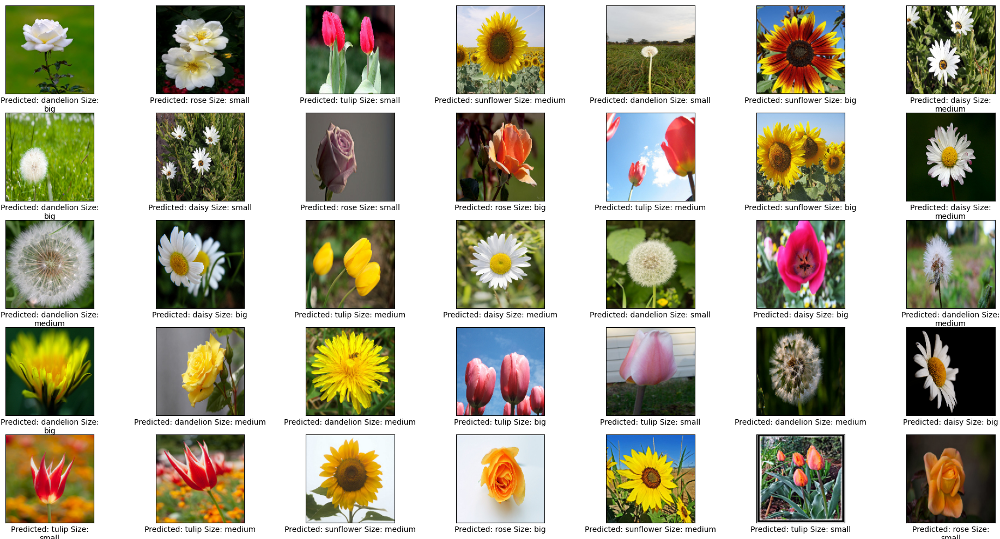

In [22]:
plt.figure(figsize=(20, 10))



for i in range(35):
    plt.subplot(5, 7, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid = False
    plt.imshow(cv2.cvtColor(test_images[i], cv2.COLOR_BGR2RGB))
    predicted_label = index_to_label[predicted_labels[i]]
    flower_size = area_to_label[flower_sizes[i]]
    plt.xlabel("Predicted: {} Size: {}".format(predicted_label,flower_size), wrap=True)
plt.tight_layout()
plt.show()